In [1]:
import jwst
from astropy.table import Table
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import match_coordinates_sky,SkyCoord, Angle
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import warnings

warnings.filterwarnings('ignore')

date = 'Feb172023'

# Filename to save to
saveto = 'CC_Catalog_'+date

# Paths to NIRCam (n) and MIRI (m) data
path_n = "../../ngc3324/NIRCAM_ALL_"+date+"/JWST/jw02731-o001_t017_nircam_"
path_m = "../../ngc3324/MIRI_ALL_"+date+"/JWST/jw02731-o002_t017_miri_"
n_bands = ['f090w','f187n','f200w','f335m','f444w','f444w-f470n']
m_bands = ['f770w', 'f1130w', 'f1280w', 'f1800w']
nm_bands = ['f090w','f187n','f200w','f335m','f444w','f444w-f470n','f770w', 'f1130w', 'f1280w', 'f1800w']
t = []

# Make catalogue which contains one row for every object detected, adding each band to the end **NOT MATCHED**
for i, band in enumerate(n_bands):
    # Get the tables
    # t.append(Table.read(path+band+"/jw02739-o001_t001_nircam_"+band+"_cat.ecsv")) # M16 - Pillars of Creation
    if band != 'f444w-f470n':
        t.append(Table.read(path_n+"clear-"+band+"/jw02731-o001_t017_nircam_clear-"+band+"_cat.ecsv")) # NGC 3324 - Cosmic Cliffs
    else:
        t.append(Table.read(path_n+band+"/jw02731-o001_t017_nircam_"+band+"_cat.ecsv")) # NGC 3324 - Cosmic Cliffs
    print(len(t[i]))


for i, band in enumerate(m_bands):
    # Get the tables
    t.append(Table.read(path_m+band+"/jw02731-o002_t017_miri_"+band+"_cat.ecsv"))
    print(len(t[i+6]))

# Define the measurement types, aperature types
meas_type = 'vegamag'
meas_type2 = 'flux'
ap_type = 'isophotal'
ap_type2 = 'aper30'
ap_type3 = 'aper50'
ap_type4 = 'aper70'
ap_type5 = 'aper_total'

# Add the size of the objects to the bands
for i, f in enumerate(nm_bands):
    if i < 3:
        t[i]['size'] = np.sqrt((t[i]['semimajor_sigma']**2)+t[i]['semiminor_sigma']**2)*0.031/3600 # Convert pixels to arcseconds, arcseconds to degrees (F090,187,200)
    elif i<6:
        t[i]['size'] = np.sqrt((t[i]['semimajor_sigma']**2)+t[i]['semiminor_sigma']**2)*0.063/3600 # Convert pixels to arcseconds, arcseconds to degrees (F335,444,470) 
    else:
        t[i]['size'] = np.sqrt((t[i]['semimajor_sigma']**2)+t[i]['semiminor_sigma']**2)*0.11/3600 # Convert pixels to arcseconds, arcseconds to degrees (MIRI)
    
    t[i] = t[i].to_pandas()[['sky_centroid.ra', 'sky_centroid.dec','size', ap_type+'_'+meas_type, ap_type+'_'+meas_type+'_err', \
        ap_type2+'_'+meas_type, ap_type2+'_'+meas_type+'_err', ap_type3+'_'+meas_type, ap_type3+'_'+meas_type+'_err',\
            ap_type4+'_'+meas_type, ap_type4+'_'+meas_type+'_err',ap_type5+'_'+meas_type, ap_type5+'_'+meas_type+'_err',\
                ap_type+'_'+meas_type2, ap_type+'_'+meas_type2+'_err', \
        ap_type2+'_'+meas_type2, ap_type2+'_'+meas_type2+'_err', ap_type3+'_'+meas_type2, ap_type3+'_'+meas_type2+'_err',\
            ap_type4+'_'+meas_type2, ap_type4+'_'+meas_type2+'_err',ap_type5+'_'+meas_type2, ap_type5+'_'+meas_type2+'_err']]
    t[i].rename(columns={'sky_centroid.ra': 'RA', 'sky_centroid.dec': 'DEC',ap_type+'_'+meas_type:ap_type+'_'+meas_type+'_'+f, ap_type+'_'+meas_type+'_err': ap_type+'_'+meas_type+'_err_'+f,\
        ap_type2+'_'+meas_type:ap_type2+'_'+meas_type+'_'+f, ap_type2+'_'+meas_type+'_err': ap_type2+'_'+meas_type+'_err_'+f,ap_type3+'_'+meas_type:ap_type3+'_'+meas_type+'_'+f, ap_type3+'_'+meas_type+'_err': ap_type3+'_'+meas_type+'_err_'+f,\
            ap_type4+'_'+meas_type:ap_type4+'_'+meas_type+'_'+f, ap_type4+'_'+meas_type+'_err': ap_type4+'_'+meas_type+'_err_'+f,ap_type5+'_'+meas_type:ap_type5+'_'+meas_type+'_'+f, ap_type5+'_'+meas_type+'_err': ap_type5+'_'+meas_type+'_err_'+f,\
                ap_type+'_'+meas_type2:ap_type+'_'+meas_type2+'_'+f, ap_type+'_'+meas_type2+'_err': ap_type+'_'+meas_type2+'_err_'+f,\
        ap_type2+'_'+meas_type2:ap_type2+'_'+meas_type2+'_'+f, ap_type2+'_'+meas_type2+'_err': ap_type2+'_'+meas_type2+'_err_'+f,ap_type3+'_'+meas_type2:ap_type3+'_'+meas_type2+'_'+f, ap_type3+'_'+meas_type2+'_err': ap_type3+'_'+meas_type2+'_err_'+f,\
            ap_type4+'_'+meas_type2:ap_type4+'_'+meas_type2+'_'+f, ap_type4+'_'+meas_type2+'_err': ap_type4+'_'+meas_type2+'_err_'+f,ap_type5+'_'+meas_type2:ap_type5+'_'+meas_type2+'_'+f, ap_type5+'_'+meas_type2+'_err': ap_type5+'_'+meas_type2+'_err_'+f},inplace=True)

# Make into one table, sort
data_all_filters_NIRCam_MIRI = pd.concat([t[0],t[1],t[2],t[3],t[4],t[5],t[6],t[7],t[8],t[9]],ignore_index=True) # MIRI: ,t[6],t[7],t[8],t[9]
data_all_filters_NIRCam_MIRI.sort_values(ap_type+'_'+meas_type+'_f200w', ascending=True,inplace=True)
data_all_filters_NIRCam_MIRI.reset_index(drop=True,inplace=True)



7906
8808
18776
2529
3881
3306
229
183
161
166


# objects in f090w filter: 7906
RA offset in band  f090w -1.0638618837077483e-06  and DEC offset is  -6.480237066678368e-07
# objects matched from f090w filter: 5766
# objects in f187n filter: 8808
RA offset in band  f187n -2.3661018192056763e-07  and DEC offset is  2.816618318252861e-06
# objects matched from f187n filter: 3088
# objects in f335m filter: 2529
RA offset in band  f335m -1.0953947125307885e-05  and DEC offset is  -1.0153927757245603e-05
# objects matched from f335m filter: 1971
# objects in f444w filter: 3881
RA offset in band  f444w -2.232304494135249e-05  and DEC offset is  -6.014072286673083e-06
# objects matched from f444w filter: 3519
# objects in f444w-f470n filter: 3306
RA offset in band  f444w-f470n -2.4947674437832873e-05  and DEC offset is  -4.124822196659592e-06
# objects matched from f444w-f470n filter: 2981
# objects in f770w filter: 229
RA offset in band  f770w -8.067151791468774e-06  and DEC offset is  1.3892273511117992e-05
# objects matched from f770w fi

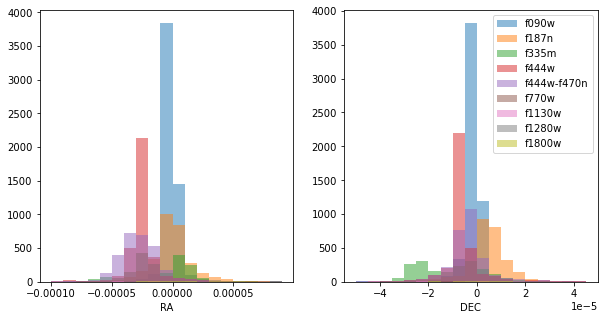

In [2]:

# Use match coordinates sky
# Any object that isn't in index gets appended to the end of the dataframe, this makes the new catalog
# Use new catalog to match next set of objects
filters = ['f090w', 'f187n','f335m','f444w','f444w-f470n','f770w','f1130w','f1280w','f1800w']

# First look at 2 micron data (most populated band)
j_sky = SkyCoord(data_all_filters_NIRCam_MIRI.dropna(subset='isophotal_vegamag_f200w').RA*u.deg, data_all_filters_NIRCam_MIRI.dropna(subset='isophotal_vegamag_f200w').DEC*u.deg)
j_all = data_all_filters_NIRCam_MIRI.dropna(subset='isophotal_vegamag_f200w') # look only at 2 micron data
j_all = j_all[j_all.columns[~j_all.isnull().all()]] # drop nan rows
j_all.reset_index(drop=True,inplace=True) # Start fresh dataframe
# tol = max(data_all_filters_NIRCam_MIRI['size'])

fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].set_xlabel('RA')
axs[1].set_xlabel('DEC')

for f in filters:
    # Running through filters, make a temporary data frame which holds only objects in that filter
    f_df = data_all_filters_NIRCam_MIRI.dropna(subset='isophotal_vegamag_'+f)
    f_df = f_df[f_df.columns[~f_df.isnull().all()]]
    print("# objects in",f,"filter:",len(f_df))
    add_sky = SkyCoord(f_df.RA*u.deg, f_df.DEC*u.deg) # Collect their sky coords
    idx, sep2d, _ = match_coordinates_sky(add_sky,j_sky) # Find the nearest match
    sep_constraint = sep2d < f_df['size'].values*u.deg #make sure the nearest match is within the size of the object

    j_matches = j_all.iloc[idx[sep_constraint]] # All closest objects within sigma distance from catalog
    j_nonmatches = j_all.drop(idx[sep_constraint],axis=0) # All other objects from catalog
    j_matches.reset_index(drop=True,inplace=True)
    j_nonmatches.reset_index(drop=True,inplace=True)

    f_matches = f_df.iloc[sep_constraint] # All closest objects from filter
    f_nonmatches = f_df.iloc[~sep_constraint] # All other objects from filter
    f_matches.reset_index(drop=True,inplace=True)
    f_nonmatches.reset_index(drop=True,inplace=True)

    # Plot the difference between matched objects
    axs[0].hist(j_matches.RA - f_matches.RA,alpha=0.5,bins=np.arange(-0.0001,0.0001,0.00001),label=f)
    axs[1].hist(j_matches.DEC - f_matches.DEC,alpha=0.5,bins=np.arange(-0.00005,0.00005,0.000005),label=f)

    print('RA offset in band ',f,np.mean(j_matches.RA - f_matches.RA),' and DEC offset is ',np.mean(j_matches.DEC - f_matches.DEC))

    j_nonmatches[f_matches.columns[3:]] = np.nan # Fill the new bands with nan
    f_nonmatches[j_matches.columns[3:]] = np.nan # Fill the new bands with nan
    f_nonmatches['RA'] = f_nonmatches.RA + np.mean(j_matches.RA - f_matches.RA) # Shift the new data RA/DEC so it would match with the 2micron band
    f_nonmatches['DEC'] = f_nonmatches.DEC + np.mean(j_matches.DEC - f_matches.DEC)

    j_all = pd.concat([j_matches,f_matches[f_matches.columns[3:]]],axis=1) # Redefine the overall catalogue to be the matched data
    print('# objects matched from',f,"filter:",len(j_all))
    j_all = pd.concat([j_all,j_nonmatches,f_nonmatches],axis=0) # Add unmatched data to the end
    j_all.reset_index(drop=True,inplace=True) # Make a new index
    j_sky = SkyCoord(j_all.RA*u.deg,j_all.DEC*u.deg) # Redefine new j_sky based on matched catalogue

plt.legend()

In [3]:

# Save catalogue without any targets, remove all spurious detections (only one band with detection)
# catalog = j_all
bands = [idx for idx in j_all.columns if (idx[:3] == 'iso' and idx[10]=='v')] 
cols = np.r_[['RA'],['DEC'],bands]
webb_inp_dropped = j_all.dropna(thresh=2,subset=[idx for idx in bands if idx[-8]!='r' and idx[-13]!='r' and idx[10]=='v'])
webb_inp_dropped.to_csv(saveto+'.csv')
print('Number of rows dropped = ',len(j_all)-len(webb_inp_dropped))
catalog = webb_inp_dropped[cols]



# Add SPICY Predictions
spit2m_cat = pd.read_csv('../Archive/Phase_4__2MASS_UpperLim_Classification/Scripts/NGC_3324_w_Preds.csv')
spicy_cat = pd.read_csv('../Archive/SPICY_YSO_SubClasses.csv',comment='#')

spit2m_cat = spit2m_cat[spit2m_cat.RAJ2000<max(catalog.RA)]
spit2m_cat = spit2m_cat[spit2m_cat.RAJ2000>min(catalog.RA)]
spit2m_cat = spit2m_cat[spit2m_cat.DEJ2000<max(catalog.DEC)]
spit2m_cat = spit2m_cat[spit2m_cat.DEJ2000>min(catalog.DEC)]

# SPITZER data
# Match to JWST catalog using astropy match_catalog_sky
# Obtain SkyCoords
j_sky = SkyCoord(catalog.RA*u.deg, catalog.DEC*u.deg)
s2_sky = SkyCoord(spit2m_cat.RAJ2000*u.deg, spit2m_cat.DEJ2000*u.deg)
# Set tolerance - matched objects that are at most this far apart are considered one object
tol = 0.005 #in degrees #max(catalog['size'])
# Match
idx, sep2d, x = match_coordinates_sky(s2_sky, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
sep_constraint = sep2d < tol*u.deg
print("Number of Spitzer sources found:",np.count_nonzero(sep_constraint))
# Make new data frames which contain only the matched data, in the order of it's matching
j_matches = catalog.iloc[idx[sep_constraint]]
s2_matches = spit2m_cat.iloc[sep_constraint]
# Reset the indices in order to match between two catalogues using pd concat
j_matches.reset_index(drop=True,inplace=True)
s2_matches.reset_index(drop=True,inplace=True)
jwst_spitz_cat = pd.concat([j_matches,s2_matches],axis=1)

# SPICY predictions
# Match to JWST catalog using astropy match_catalog_sky
j_sky = SkyCoord(jwst_spitz_cat.RAJ2000*u.deg, jwst_spitz_cat.DEJ2000*u.deg)
sp_sky = SkyCoord(spicy_cat['     RAdeg      DEdeg'].to_numpy(),unit=u.deg)
idx, sep2d, _ = match_coordinates_sky(sp_sky, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
sep_constraint = sep2d < tol*u.deg
print("Number of SPICY sources found:",np.count_nonzero(sep_constraint))
j_matches = jwst_spitz_cat.iloc[idx[sep_constraint]]
s2_matches = spicy_cat.iloc[sep_constraint]
j_matches.reset_index(inplace=True)
s2_matches.reset_index(drop=True,inplace=True)
# This catalogue contains only objects with SPICY detections
jwst_spitz_spicy_cat = pd.concat([j_matches,s2_matches[[' SPICY','class    ','p1']]],axis=1)

# Connect SPICY predictions to JWST/Spitzer matched catalogue
spicy_df_to_add = pd.DataFrame(data={'SPICY':jwst_spitz_spicy_cat[' SPICY'].values,'SPICY_Class':jwst_spitz_spicy_cat['class    '].values,'SPICY_Prob':jwst_spitz_spicy_cat['p1'].values},index=jwst_spitz_spicy_cat['index'])
df_to_add = pd.DataFrame()
df_to_add[spicy_df_to_add.columns] = [[np.nan]*len(spicy_df_to_add.columns)]*len(jwst_spitz_cat)
df_to_add.SPICY_Prob = [0.0]*len(df_to_add)
df_to_add.iloc[spicy_df_to_add.index] = spicy_df_to_add
jwst_spitz_cat[df_to_add.columns] = df_to_add

# Specify true and false class
jwst_spitz_cat['SPICY_Class_0/1'] = 0
spicy_ind = np.where(np.isnan(jwst_spitz_cat.SPICY))[0]
jwst_spitz_cat['SPICY_Class_0/1'].loc[spicy_ind] = 1

# Save Spitzer and JWST matched data
jwst_spitz_cat.to_csv(saveto+"_SPICY_Preds.csv")

Number of rows dropped =  19619
Number of Spitzer sources found: 446
Number of SPICY sources found: 26


In [4]:
jwst_spitz_cat.head()

,RA,DEC,isophotal_vegamag_f200w,isophotal_vegamag_err_f200w,isophotal_vegamag_f090w,isophotal_vegamag_err_f090w,isophotal_vegamag_f187n,isophotal_vegamag_err_f187n,isophotal_vegamag_f335m,isophotal_vegamag_err_f335m,...,mag_IR3,e_mag_IR3,mag_IR4,e_mag_IR4,alpha,Preds,SPICY,SPICY_Class,SPICY_Prob,SPICY_Class_0/1
0,159.172344,-58.555753,19.506231,0.004755,NaN,NaN,19.794421,0.019863,NaN,NaN,...,18.524,0.144951,18.350,0.119339,-10.45256,2.0,NaN,NaN,0.0,1
1,159.263733,-58.574518,16.101761,0.001493,19.671527,0.003703,NaN,NaN,15.495948,0.003075,...,18.524,0.144951,18.350,0.119339,-11.33816,2.0,NaN,NaN,0.0,1
2,159.238838,-58.666903,NaN,NaN,NaN,NaN,11.722802,0.000300,12.344643,0.000296,...,10.126,0.047000,10.103,0.045000,-2.62484,0.0,NaN,NaN,0.0,1
3,159.175095,-58.676816,NaN,NaN,NaN,NaN,NaN,NaN,14.422830,0.001892,...,18.524,0.144951,18.350,0.119339,-10.53456,2.0,NaN,NaN,0.0,1
4,159.216155,-58.667535,NaN,NaN,17.337431,0.002272,NaN,NaN,NaN,NaN,...,10.806,0.158000,18.350,0.119339,-14.54928,2.0,NaN,NaN,0.0,1


In [8]:
reit_name = ['MHO1632','MHO1633','MHO1634','MHO1635','MHO1636','MHO1637','MHO1638','MHO1639, HH1221, HH1003A','MHO1640','MHO1643, HH1218','MHO1645, MHO1646','MHO1647, HH1002C','MHO1649','MHO1650',\
    'MHO1651','MHO1652','MHO1641a','MHO1641b','HH1219','HH1223','HHc-3','HHc-4','HHc-5']
reit = ["10:36:42.3 -58:38:04", "10:36:48.0 -58:38:19", "10:36:47.3 -58:38:10", "10:36:46.7 -58:38:05", "10:36:51.5 -58:37:54", "10:36:50.5 -58:37:52",\
    "10:36:51.4 -58:37:48", "10:36:53.8 -58:37:48", "10:36:51.5 -58:37:10", "10:36:54.2 -58:36:26", "10:36:54.4 -58:36:18", "10:36:54.0 -58:37:20",\
        "10:36:53.6 -58:35:20", "10:36:53.1 -58:37:37", "10:36:53.3 -58:37:54", "10:36:52.7 -58:38:05", "10:36:53.1 -58:37:08", "10:36:51.6 -58:36:58",\
        "10:36:52.3 -58:38:09", "10:36:53.9 -58:36:29", "10:37:01.5 -58:37:51", "10:37:02.1 -58:36:58", "10:36:53.9 -58:36:32"]# End of third row is the end of MHO-only sources
r_1 = SkyCoord(reit,unit=(u.hourangle, u.deg))
CC_Webb_Classified = catalog
# tab_preds = open("Table_Reiter_SPICY_YSO.txt",'w')
# tab_preds.write("\citet{Kuhn2021} & \citet{Reiter2022} & Our Work \\\ \hline \n")

j_sky = SkyCoord(CC_Webb_Classified.RA*u.deg,CC_Webb_Classified.DEC*u.deg)
r_inds, sep2d, _ = match_coordinates_sky(r_1, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
# r_matches = CC_Webb_Classified.iloc[r_inds[sep2d<0.005*u.deg]]
# sp_inds = CC_Webb_Classified.dropna(subset='SPICY',axis=1).index
# print(r_inds)
# print(np.c_[r_inds,sp_inds])
# matched_inds = np.unique(np.c_[r_inds,sp_inds])
# print(matched_inds)

# for m, i in enumerate(matched_inds):
#     df_tmp = CC_Webb_Classified.iloc[m]
#     if m in r_inds:
#         if m in sp_inds:
#             tab_preds.write(f"{df_tmp.SPICY_Class} - SPICY {df_tmp.SPICY} & {reit_name[i]} & {df_tmp[['Class']]} \\\ \n")
#         else:
#             tab_preds.write(f" & {reit_name[i]} & {df_tmp[['Class']]} \\\ \n")
#     else:
#         tab_preds.write(f"{df_tmp.SPICY_Class} - SPICY {df_tmp.SPICY} &  & {df_tmp[['Class']]} \\\ \n")

# tab_preds.close()

5.6532199010916884e-05

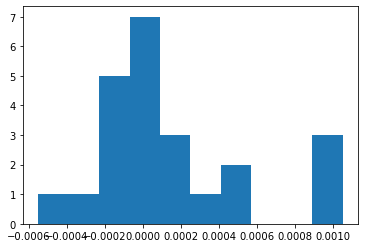

In [26]:
# print(r_1.ra.to(u.deg)/u.deg)
tmp_j = j_sky.ra[r_inds].to(u.deg)/u.deg
tmp_r = r_1.ra.to(u.deg)/u.deg
tmp_dif = tmp_j-tmp_r
# tmp_dif.unit
# print(tmp_j-tmp_r)
plt.hist(tmp_dif.value)

np.median(tmp_dif.value)

1.0749499310236388e-05

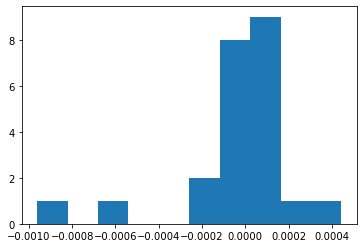

In [23]:

tmp_j = j_sky.dec[r_inds].to(u.deg)/u.deg
tmp_r = r_1.dec.to(u.deg)/u.deg
tmp_dif = tmp_j-tmp_r
# tmp_dif.unit
# print(tmp_j-tmp_r)
plt.hist(tmp_dif.value)

np.median(tmp_dif.value)

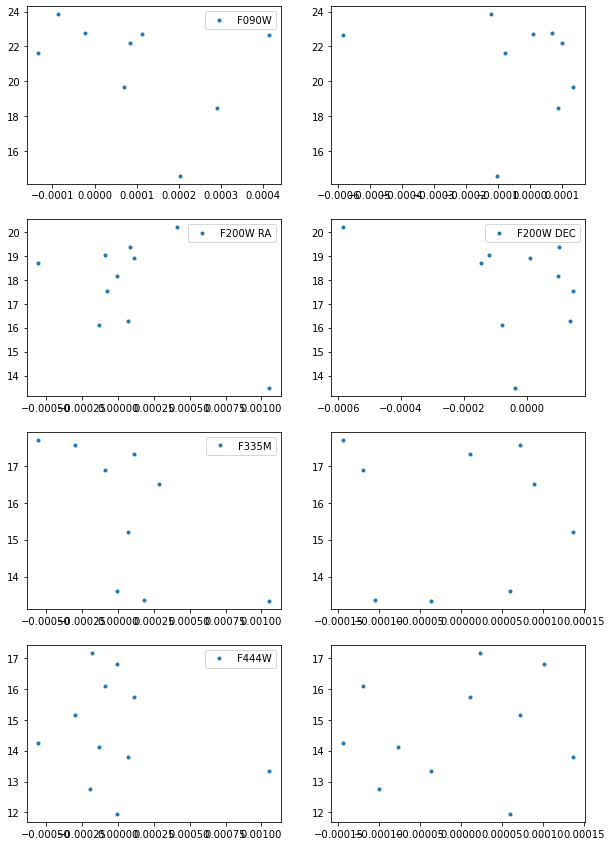

In [37]:
fig, axs = plt.subplots(4,2,figsize=(10,15))
axs[1][1].plot((j_sky.dec[r_inds].to(u.deg)/u.deg-r_1.dec.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f200w']].iloc[r_inds].values,'.',label='F200W DEC')
axs[1][0].plot((j_sky.ra[r_inds].to(u.deg)/u.deg-r_1.ra.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f200w']].iloc[r_inds].values,'.',label='F200W RA')

axs[0][1].plot((j_sky.dec[r_inds].to(u.deg)/u.deg-r_1.dec.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f090w']].iloc[r_inds].values,'.')
axs[0][0].plot((j_sky.ra[r_inds].to(u.deg)/u.deg-r_1.ra.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f090w']].iloc[r_inds].values,'.',label='F090W')

axs[2][1].plot((j_sky.dec[r_inds].to(u.deg)/u.deg-r_1.dec.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f335m']].iloc[r_inds].values,'.')
axs[2][0].plot((j_sky.ra[r_inds].to(u.deg)/u.deg-r_1.ra.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f335m']].iloc[r_inds].values,'.',label='F335M')

axs[3][1].plot((j_sky.dec[r_inds].to(u.deg)/u.deg-r_1.dec.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f444w']].iloc[r_inds].values,'.')
axs[3][0].plot((j_sky.ra[r_inds].to(u.deg)/u.deg-r_1.ra.to(u.deg)/u.deg).value, CC_Webb_Classified[['isophotal_vegamag_f444w']].iloc[r_inds].values,'.',label='F444W')

axs[0][0].legend()
axs[1][0].legend()
axs[1][1].legend()
axs[2][0].legend()
axs[3][0].legend()

In [2]:
import pandas as pd
spit2m_cat = pd.read_csv('SPICY_GaiaEDR3.csv',comment='#')

/var/folders/qy/7yz8bmv96hx8rndql_rfdz_80000gn/T/ipykernel_89688/3811588823.py:2: DtypeWarning: Columns (8,9,10,15,16,22,36,37,40,41) have mixed types. Specify dtype option on import or set low_memory=False.
  spit2m_cat = pd.read_csv('SPICY_GaiaEDR3.csv',comment='#')


In [18]:
from astropy.io import fits
from astropy.table import Table
data = Table(fits.open('J_A+A_564_A120_table3.dat.fits')[1].data)
print(data.columns)

<TableColumns names=('Seq','Name','VISTA','Jmag','Hmag','Ksmag','SNRJ','SNRH','SNRKs','Src','Spitzer','[3.4]','[4.5]','[5.8]','[8.0]','SNR1','SNR2','SNR3','SNR4')>


/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/io/fits/column.py:831: VerifyWarning: It is strongly recommended that column names contain only upper and lower-case ASCII letters, digits, or underscores for maximum compatibility with other software (got '[3.4]').
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/io/fits/column.py:831: VerifyWarning: It is strongly recommended that column names contain only upper and lower-case ASCII letters, digits, or underscores for maximum compatibility with other software (got '[4.5]').
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/io/fits/column.py:831: VerifyWarning: It is strongly recommended that column names contain only upper and lower-case ASCII letters, digits, or underscores for maximum compatibility with other software (got '[5.8]').
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10

In [19]:
print(data)

Seq        Name              VISTA         Jmag  Hmag ...  SNR1  SNR2 SNR3  SNR4
--- ------------------ ------------------ ----- ----- ... ----- ----- ---- -----
  1 103624.03-584017.1 103624.04-584017.1 15.26 14.65 ...  51.0  24.0  0.0   0.0
  2 103628.40-584329.2 103628.20-584328.4 20.44  19.8 ...   0.0   0.0  0.0   0.0
  3 103631.80-583944.6 103631.93-583945.0 18.65 16.97 ...   0.0   0.0  0.0   0.0
  4 103633.02-584043.8                    -9.99 -9.99 ...   0.0   0.0  0.0   0.0
  5 103633.54-584052.8 103633.51-584051.5 19.22 18.26 ...   0.0   0.0  0.0   0.0
  6 103634.52-584310.7                    -9.99 -9.99 ...   0.0   0.0  0.0   0.0
  7 103635.14-583824.2 103635.19-583825.2 14.36 12.87 ... 183.6 124.1  0.0   0.0
  8 103636.22-584134.1 103636.21-584133.1 16.38 15.66 ...   0.0   0.0  0.0   0.0
  9 103636.63-584245.6 103636.58-584245.0 19.14 16.06 ...  68.5  63.1 39.0 101.9
 10 103637.62-584055.3 103637.58-584055.8 16.11 14.59 ...   0.0  39.5  0.0   0.0
...                ...      

# XRAY Add to file

In [29]:
from astropy.coordinates import SkyCoord, match_coordinates_sky

data.columns
xray = data.to_pandas()
xray_radec = Table(fits.open('J_A+A_564_A120_table1.dat.fits')[1].data).to_pandas()

xray['SkyCoords'] = SkyCoord(xray_radec.RAdeg,xray_radec.DEdeg, unit='deg')
# xray_sky = SkyCoord(f"{xray.Spitzer.split('-')[0]} {xray.Spitzer.split('-')[1]}")
catalog = pd.read_csv('CC_Catalog_Feb172023.csv')


In [45]:

# SPITZER data
# Match to JWST catalog using astropy match_catalog_sky
# Obtain SkyCoords
j_sky = SkyCoord(catalog.RA*u.deg, catalog.DEC*u.deg)
x_sky = SkyCoord(xray_radec.RAdeg,xray_radec.DEdeg, unit='deg')
# Set tolerance - matched objects that are at most this far apart are considered one object
tol = 0.005 #in degrees #max(catalog['size'])
# Match
idx, sep2d, x = match_coordinates_sky(x_sky, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
sep_constraint = sep2d < tol*u.deg
print("Number of XRay sources found:",np.count_nonzero(sep_constraint))
# Make new data frames which contain only the matched data, in the order of it's matching
j_matches = catalog.iloc[idx[sep_constraint]]
x_matches = xray.iloc[sep_constraint]
# Reset the indices in order to match between two catalogues using pd concat
j_matches.reset_index(drop=True,inplace=True)
x_matches.reset_index(drop=True,inplace=True)
jwst_xray_cat = pd.concat([j_matches,x_matches],axis=1)

# # SPICY predictions
# # Match to JWST catalog using astropy match_catalog_sky
# j_sky = SkyCoord(jwst_xray_cat.RA*u.deg, jwst_xray_cat.DEC*u.deg)
# sp_sky = SkyCoord(spicy_cat['     RAdeg      DEdeg'].to_numpy(),unit=u.deg)
# idx, sep2d, _ = match_coordinates_sky(sp_sky, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
# sep_constraint = sep2d < tol*u.deg
# print("Number of SPICY sources found:",np.count_nonzero(sep_constraint))
# j_matches = jwst_xray_cat.iloc[idx[sep_constraint]]
# s2_matches = spicy_cat.iloc[sep_constraint]
# j_matches.reset_index(inplace=True)
# s2_matches.reset_index(drop=True,inplace=True)
# # This catalogue contains only objects with SPICY detections
# jwst_xray_spicy_cat = pd.concat([j_matches,s2_matches[[' SPICY','class    ','p1']]],axis=1)

# # Connect SPICY predictions to JWST/Spitzer matched catalogue
# spicy_df_to_add = pd.DataFrame(data={'SPICY':jwst_xray_spicy_cat[' SPICY'].values,'SPICY_Class':jwst_xray_spicy_cat['class    '].values,'SPICY_Prob':jwst_xray_spicy_cat['p1'].values},index=jwst_xray_spicy_cat['index'])
# df_to_add = pd.DataFrame()
# df_to_add[spicy_df_to_add.columns] = [[np.nan]*len(spicy_df_to_add.columns)]*len(jwst_xray_cat)
# df_to_add.SPICY_Prob = [0.0]*len(df_to_add)
# df_to_add.iloc[spicy_df_to_add.index] = spicy_df_to_add
# jwst_xray_cat[df_to_add.columns] = df_to_add

# # Specify true and false class
# jwst_xray_cat['SPICY_Class_0/1'] = 0
# spicy_ind = np.where(np.isnan(jwst_xray_cat.SPICY))[0]
# jwst_xray_cat['SPICY_Class_0/1'].loc[spicy_ind] = 1


Number of XRay sources found: 78


In [47]:
import jwst
from astropy.table import Table
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import match_coordinates_sky,SkyCoord, Angle
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

spicy_cat = pd.read_csv('../Archive/SPICY_YSO_SubClasses.csv',comment='#')

/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-06-03T10:07:58.266' from MJD-BEG.
Set DATE-AVG to '2022-06-03T12:45:26.326' from MJD-AVG.
Set DATE-END to '2022-06-03T15:22:38.772' from MJD-END'.
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -82.720248 from OBSGEO-[XYZ].
Set OBSGEO-B to   -31.576394 from OBSGEO-[XYZ].
Set OBSGEO-H to 1654475546.366 from OBSGEO-[XYZ]'.
  warnings.warn(


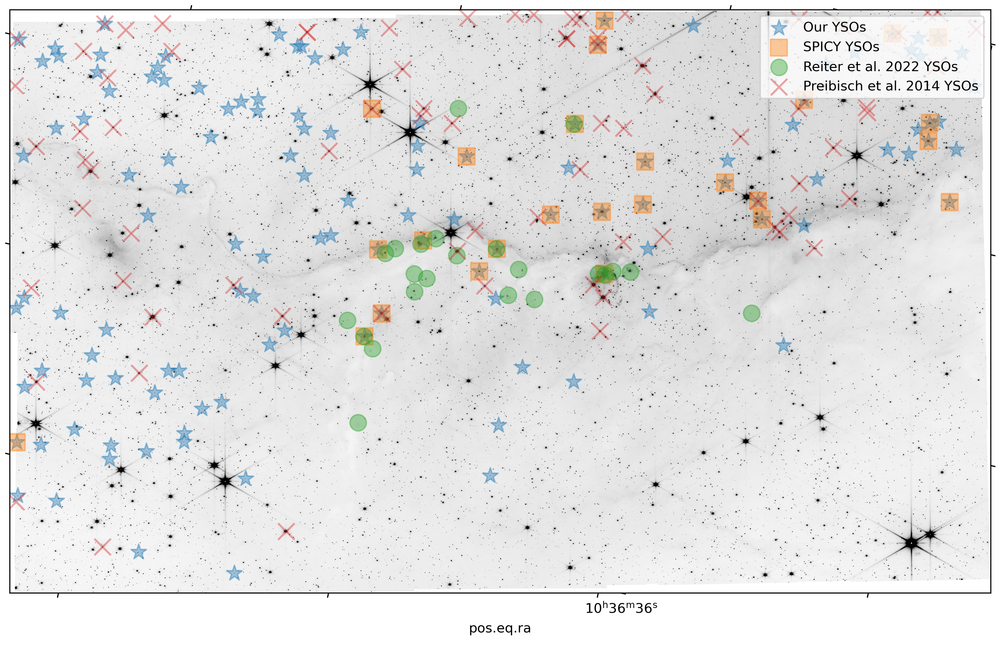

In [48]:

from astropy.io import fits
from astropy.wcs import WCS
CC_Webb_Classified = pd.read_csv('CC_Webb_Predictions_Prob_Feb172023.csv')


# Plot image
filter = "f200w"
image_file = f"../../ngc3324/FITS/JWST_{filter}.fits"


h = fits.getheader(image_file)
f = fits.open(image_file)
wcs = WCS(f[1].header)
fig, ax = plt.subplots(figsize=(14,8),dpi=300)
ax = plt.subplot(projection=wcs)
plt.grid(color='white', ls='solid')
plt.imshow(f[1].data,cmap='gray_r',vmin=0,vmax=20,origin='lower')
ymax, ymin = ax.get_ylim()
xmax, xmin = ax.get_xlim()

reit = ["10:36:42.3 -58:38:04", "10:36:48.0 -58:38:19", "10:36:47.3 -58:38:10", "10:36:46.7 -58:38:05", "10:36:51.5 -58:37:54", "10:36:50.5 -58:37:52",\
    "10:36:51.4 -58:37:48", "10:36:53.8 -58:37:48", "10:36:51.5 -58:37:10", "10:36:54.2 -58:36:26", "10:36:54.4 -58:36:18", "10:36:54.0 -58:37:20",\
        "10:36:53.6 -58:35:20", "10:36:53.1 -58:37:37", "10:36:53.3 -58:37:54", "10:36:52.7 -58:38:05", "10:36:53.1 -58:37:08", "10:36:51.6 -58:36:58",\
        "10:36:52.3 -58:38:09", "10:36:53.9 -58:36:29", "10:37:01.5 -58:37:51", "10:37:02.1 -58:36:58", "10:36:53.9 -58:36:32"]# End of third row is the end of MHO-only sources
r_1 = SkyCoord(reit,unit=(u.hourangle, u.deg))

ra_1 = r_1.ra
dec_1 = r_1.dec

ra_spicy = CC_Webb_Classified.RA.values[CC_Webb_Classified['SPICY_Class_0/1']==0]
dec_spicy = CC_Webb_Classified.DEC.values[CC_Webb_Classified['SPICY_Class_0/1']==0]


ra_yso = CC_Webb_Classified.RA.values[CC_Webb_Classified.Class == 0]
dec_yso = CC_Webb_Classified.DEC.values[CC_Webb_Classified.Class == 0]

ra_x = jwst_xray_cat.RA
dec_x = jwst_xray_cat.DEC

plt.scatter(ra_yso,dec_yso, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Our YSOs')
plt.scatter(ra_spicy,dec_spicy, marker='s',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='SPICY YSOs')
plt.scatter(ra_1,dec_1, marker='o',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Reiter et al. 2022 YSOs')
plt.scatter(ra_x,dec_x, marker='x',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Preibisch et al. 2014 YSOs')
ax.set_ylim(ymax, ymin)
ax.set_xlim(xmax, xmin)
plt.legend(loc=1)
ax.grid(False)
# plt.xticks()
# plt.yticks()
# plt.xlabel('RA')
# plt.ylabel('DEC')

# Make a catalog which contains JWST data with Spitzer data. 
Add in if the object is classified as a YSO by SPICY in one column, and if it's an X-ray source in a second column, with a flag for pre-classified.
Output two files:
* A blanket file which contains all of the above, unclassified by final algorithm.
* A file which contains only those objects which have SPICY *OR* X-ray sources. 

In [417]:
cat = CC_Webb_Classified[['RA', 'DEC', 'size', 'isophotal_vegamag_f200w',
       'isophotal_vegamag_err_f200w', 'isophotal_vegamag_f090w',
       'isophotal_vegamag_err_f090w', 'isophotal_vegamag_f187n',
       'isophotal_vegamag_err_f187n', 'isophotal_vegamag_f335m',
       'isophotal_vegamag_err_f335m', 'isophotal_vegamag_f444w',
       'isophotal_vegamag_err_f444w', 'isophotal_vegamag_f444w-f470n',
       'isophotal_vegamag_err_f444w-f470n', 'isophotal_vegamag_f770w',
       'isophotal_vegamag_err_f770w', 'isophotal_vegamag_f1130w',
       'isophotal_vegamag_err_f1130w', 'isophotal_vegamag_f1280w',
       'isophotal_vegamag_err_f1280w', 'isophotal_vegamag_f1800w',
       'isophotal_vegamag_err_f1800w', 'mag_J', 'e_mag_J',
       'mag_H', 'e_mag_H', 'mag_Ks', 'e_mag_Ks', 'mag_IR1', 'e_mag_IR1',
       'mag_IR2', 'e_mag_IR2', 'mag_IR3', 'e_mag_IR3', 'mag_IR4', 'e_mag_IR4',
       'SPICY_Class_0/1', 'SPICY', 'SPICY_Class', 'Class']]
print(len(cat))
print(cat.columns)

spicy_cat = spicy_cat[['p1', ' SPICY']]
print(len(spicy_cat))
print(spicy_cat.columns)
cat['SPICY_Prob'] = [0] * len(cat)
cat['SPICY_Prob'].loc[~cat.SPICY.isna()] = spicy_cat.loc[cat[~cat.SPICY.isna()]['SPICY'].values-1]['p1'].values


xray_cat = Table(fits.open('J_A+A_564_A120_table3.dat.fits')[1].data).to_pandas()[['Spitzer','Jmag', 'Hmag', 'Ksmag','[3.4]', '[4.5]', '[5.8]', '[8.0]']]
xray_cat.columns = ['Spitzer','mag_J','mag_H','mag_Ks','mag_IR1','mag_IR2','mag_IR3','mag_IR4']
xray_radec = Table(fits.open('J_A+A_564_A120_table1.dat.fits')[1].data).to_pandas()
xray_cat[['RA', 'DEC']] = xray_radec[['RAdeg','DEdeg']]
# xray_cat.columns = ['mag_J', 'e_mag_J','mag_H', 'mag_Ks', 'mag_IR1','mag_IR2', 'mag_IR3','mag_IR4','SkyCoords' ]
print(len(xray_cat))
print(xray_cat.columns)


8649
Index(['RA', 'DEC', 'size', 'isophotal_vegamag_f200w',
       'isophotal_vegamag_err_f200w', 'isophotal_vegamag_f090w',
       'isophotal_vegamag_err_f090w', 'isophotal_vegamag_f187n',
       'isophotal_vegamag_err_f187n', 'isophotal_vegamag_f335m',
       'isophotal_vegamag_err_f335m', 'isophotal_vegamag_f444w',
       'isophotal_vegamag_err_f444w', 'isophotal_vegamag_f444w-f470n',
       'isophotal_vegamag_err_f444w-f470n', 'isophotal_vegamag_f770w',
       'isophotal_vegamag_err_f770w', 'isophotal_vegamag_f1130w',
       'isophotal_vegamag_err_f1130w', 'isophotal_vegamag_f1280w',
       'isophotal_vegamag_err_f1280w', 'isophotal_vegamag_f1800w',
       'isophotal_vegamag_err_f1800w', 'mag_J', 'e_mag_J', 'mag_H', 'e_mag_H',
       'mag_Ks', 'e_mag_Ks', 'mag_IR1', 'e_mag_IR1', 'mag_IR2', 'e_mag_IR2',
       'mag_IR3', 'e_mag_IR3', 'mag_IR4', 'e_mag_IR4', 'SPICY_Class_0/1',
       'SPICY', 'SPICY_Class', 'Class'],
      dtype='object')
117446
Index(['p1', ' SPICY'], dtype='object'

/var/folders/qy/7yz8bmv96hx8rndql_rfdz_80000gn/T/ipykernel_89688/3409230540.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat['SPICY_Prob'] = [0] * len(cat)
/var/folders/qy/7yz8bmv96hx8rndql_rfdz_80000gn/T/ipykernel_89688/3409230540.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat['SPICY_Prob'].loc[~cat.SPICY.isna()] = spicy_cat.loc[cat[~cat.SPICY.isna()]['SPICY'].values-1]['p1'].values
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/io/fits/column.py:831: VerifyWarning: It is strongly recommended that column names 

In [418]:
# Match SPICY/WEBB data with XRAY data
j_sky = SkyCoord(cat.RA*u.deg, cat.DEC*u.deg)
x_sky = SkyCoord(xray_cat.RA,xray_cat.DEC, unit='deg')
# Set tolerance - matched objects that are at most this far apart are considered one object
tol = 0.005 #in degrees #max(catalog['size'])
# Match
idx, sep2d, x = match_coordinates_sky(x_sky, j_sky, nthneighbor=1, storekdtree='kdtree_sky')
sep_constraint = sep2d < tol*u.deg
print("Number of XRay sources found:",np.count_nonzero(sep_constraint))
# Tag the sources with XRAY data and those which *should* have Spitzer data associated with them
cat['XRAY'] = [np.nan]*len(cat)
cat['In_Spitzer'] = [False]*len(cat)
cat.loc[idx[sep_constraint],'XRAY'] = [True]*len(idx[sep_constraint])
idx_SP = np.where(xray_cat.loc[sep_constraint, 'Spitzer'] != '                  ') # Where the XRAY sources have SPITZER counterparts
cat.loc[idx[sep_constraint][idx_SP],'In_Spitzer'] = [True]*len(idx[sep_constraint][idx_SP])

Number of XRay sources found: 78
(array([  49,   75,   90,  136,  186,  207,  238, 1296, 1362, 1603, 1718,
       1901, 1907, 2050, 2109, 2129, 2195, 2251, 2268, 2339, 2394, 2448,
       2491, 2511, 2600, 2606, 2622, 2638, 2668, 2707, 2710, 2712, 2781,
       2861, 2912, 2997, 3015, 3070, 3092, 3106, 3110, 3149, 3156, 3198,
       3215, 3624, 3783, 3983, 4022, 4063, 4183, 4206, 4949, 4950, 5499,
       5564, 5937, 5976, 5998, 6003, 6006, 6282, 7010, 7145, 7157, 7904,
       8067, 8235, 8349, 8442, 8477, 8520, 8554, 8574, 8642, 8645]),)


,RA,DEC,size,isophotal_vegamag_f200w,isophotal_vegamag_err_f200w,isophotal_vegamag_f090w,isophotal_vegamag_err_f090w,isophotal_vegamag_f187n,isophotal_vegamag_err_f187n,isophotal_vegamag_f335m,...,e_mag_IR3,mag_IR4,e_mag_IR4,SPICY_Class_0/1,SPICY,SPICY_Class,Class,SPICY_Prob,XRAY,In_Spitzer
0,159.201473,-58.599814,0.000015,21.724196,0.006790,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
1,159.209208,-58.592782,0.000094,21.497256,0.008658,NaN,NaN,NaN,NaN,11.109967,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
2,159.229419,-58.586203,0.000027,17.030622,0.000624,18.839469,0.001028,18.307348,0.002539,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
3,159.219318,-58.582575,0.000165,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
4,159.205783,-58.597835,0.000087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8644,159.303229,-58.577422,0.000027,17.511826,0.002288,20.149060,0.005508,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
8645,159.304167,-58.575519,0.000034,16.011646,0.002246,17.880142,0.003376,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,True,False
8646,159.302310,-58.580374,0.000024,17.106117,0.002119,20.217915,0.005563,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False
8647,159.300875,-58.583763,0.000032,18.756451,0.003499,21.059547,0.009751,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,NaN,False


In [419]:
tmp = xray_cat.loc[sep_constraint,['mag_J','mag_H','mag_Ks','mag_IR1','mag_IR2','mag_IR3','mag_IR4']].iloc[idx_SP]
tmp.replace(-9.99, np.NaN,inplace=True)
cat_inds = cat.loc[idx[sep_constraint][idx_SP],['mag_J','mag_H','mag_Ks','mag_IR1','mag_IR2','mag_IR3','mag_IR4']].index
tmp.set_index(cat_inds,inplace=True)
cat.loc[idx[sep_constraint][idx_SP],['mag_J','mag_H','mag_Ks','mag_IR1','mag_IR2','mag_IR3','mag_IR4']] = tmp

,mag_J,mag_H,mag_Ks,mag_IR1,mag_IR2,mag_IR3,mag_IR4
3215,14.36,12.87,12.22,11.67,11.65,NaN,NaN
1296,14.27,13.26,12.87,12.52,12.53,NaN,NaN
1362,15.17,14.21,13.87,NaN,13.58,NaN,NaN
4950,16.87,15.77,15.20,NaN,12.55,NaN,NaN
49,13.95,12.85,12.18,10.72,10.08,9.43,8.83
2129,13.10,12.54,12.28,11.78,11.73,NaN,NaN
4183,12.02,11.48,11.27,11.05,11.05,NaN,NaN
3783,12.69,12.09,11.76,11.03,10.63,9.62,8.18
2050,NaN,12.56,12.36,12.09,12.07,NaN,NaN
2511,14.98,13.74,13.16,12.14,11.82,11.22,NaN


In [421]:
# Now save files
cat_sv = cat.drop('Class',axis=1)
cat_sv.to_csv('CC_Catalog_Feb172023_w_XRAY.csv')

class_only = cat_sv.dropna(axis=0,subset=['XRAY', 'SPICY_Class_0/1'],how='all')

class_only.to_csv('CC_Catalog_Feb172023_w_XRAY_SPITZER_match_only.csv')

# Tests

In [431]:
from PRF import prf 
from sklearn.metrics import classification_report

sp_inp = class_only.dropna(axis=0,subset='SPICY_Class_0/1')[['isophotal_vegamag_f200w',
       'isophotal_vegamag_err_f200w', 'isophotal_vegamag_f090w',
       'isophotal_vegamag_err_f090w', 'isophotal_vegamag_f187n',
       'isophotal_vegamag_err_f187n', 'isophotal_vegamag_f335m',
       'isophotal_vegamag_err_f335m', 'isophotal_vegamag_f444w',
       'isophotal_vegamag_err_f444w', 'isophotal_vegamag_f444w-f470n',
       'isophotal_vegamag_err_f444w-f470n', 'isophotal_vegamag_f770w',
       'isophotal_vegamag_err_f770w', 'isophotal_vegamag_f1130w',
       'isophotal_vegamag_err_f1130w', 'isophotal_vegamag_f1280w',
       'isophotal_vegamag_err_f1280w', 'isophotal_vegamag_f1800w',
       'isophotal_vegamag_err_f1800w','RA','DEC']]
sp_tar = class_only.dropna(axis=0,subset='SPICY_Class_0/1')[['SPICY_Class_0/1']].values
sp_dtar = class_only.dropna(axis=0,subset='SPICY_Class_0/1')[['SPICY_Prob']].values.ravel().astype(float)
sp_ptar = np.array([np.array([x,1-x]) for x in sp_dtar])
# tmp = sp_dtar[sp_dtar>0.5]
# tmp_where = np.where(sp_dtar>0.5)
# sp_dtar = np.array([0] * len(sp_tar))
# sp_dtar[~np.where(sp_dtar>0.5)[0]] = 0

class_copy = class_only.reset_index(drop=True,inplace=False)
x_mask = np.array([False]*len(class_only))
x_mask[class_copy[class_copy['SPICY_Class_0/1']==1].index] = True
x_mask[class_copy[class_copy['XRAY']==True].index] = True
x_inp = class_only[x_mask][['isophotal_vegamag_f200w',
       'isophotal_vegamag_err_f200w', 'isophotal_vegamag_f090w',
       'isophotal_vegamag_err_f090w', 'isophotal_vegamag_f187n',
       'isophotal_vegamag_err_f187n', 'isophotal_vegamag_f335m',
       'isophotal_vegamag_err_f335m', 'isophotal_vegamag_f444w',
       'isophotal_vegamag_err_f444w', 'isophotal_vegamag_f444w-f470n',
       'isophotal_vegamag_err_f444w-f470n', 'isophotal_vegamag_f770w',
       'isophotal_vegamag_err_f770w', 'isophotal_vegamag_f1130w',
       'isophotal_vegamag_err_f1130w', 'isophotal_vegamag_f1280w',
       'isophotal_vegamag_err_f1280w', 'isophotal_vegamag_f1800w',
       'isophotal_vegamag_err_f1800w','RA','DEC','XRAY']]
x_tar = np.array([1]*len(x_inp))
x_tar[np.where(x_inp.XRAY==True)[0]] = 0
x_dtar = np.array([0] * len(x_tar))
x_dtar[np.where(x_inp.XRAY==True)[0]] = 1
x_ptar = np.array([np.array([x,1-x]) for x in x_dtar])
# x_tar = list(x_tar)

## Only SPICY, Test XRAY

In [435]:
prf?

Init signature:
prf(
    n_estimators=10,
    criterion='gini',
    max_features='auto',
    use_py_gini=True,
    use_py_leafs=True,
    max_depth=None,
    keep_proba=0.05,
    bootstrap=True,
    new_syn_data_frac=0,
    min_py_sum_leaf=1,
)
Docstring:      <no docstring>
File:           ~/miniforge3/envs/SF/lib/python3.10/site-packages/PRF-0.1.dev0-py3.10.egg/PRF/PRF.py
Type:           type
Subclasses:     


In [513]:
inds = np.arange(0,20,2)
prf_cls = prf(n_estimators=100, bootstrap=False, keep_proba=0.25,new_syn_data_frac=0.3, min_py_sum_leaf=0.001)
prf_cls.fit(X=sp_inp.values[:,inds], dX=sp_inp.values[:,inds+1], py=sp_ptar)#y=sp_tar

sp_pre = prf_cls.predict(X=sp_inp.values[:,inds], dX=sp_inp.values[:,inds+1])
x_pre = prf_cls.predict(X=x_inp.values.astype(np.float64)[:,inds], dX=x_inp.values.astype(np.float64)[:,inds+1])
print(classification_report(sp_tar,sp_pre))
print(classification_report(x_tar,x_pre))
print("We find ", len(x_pre[x_pre == 0]), " test sources")

              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92        26
         1.0       0.99      1.00      1.00       415

    accuracy                           0.99       441
   macro avg       1.00      0.92      0.96       441
weighted avg       0.99      0.99      0.99       441

              precision    recall  f1-score   support

           0       1.00      0.05      0.10        76
           1       0.84      1.00      0.91       382

    accuracy                           0.84       458
   macro avg       0.92      0.53      0.51       458
weighted avg       0.87      0.84      0.78       458

We find  4  test sources


/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-06-03T10:07:58.266' from MJD-BEG.
Set DATE-AVG to '2022-06-03T12:45:26.326' from MJD-AVG.
Set DATE-END to '2022-06-03T15:22:38.772' from MJD-END'.
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -82.720248 from OBSGEO-[XYZ].
Set OBSGEO-B to   -31.576394 from OBSGEO-[XYZ].
Set OBSGEO-H to 1654475546.366 from OBSGEO-[XYZ]'.
  warnings.warn(


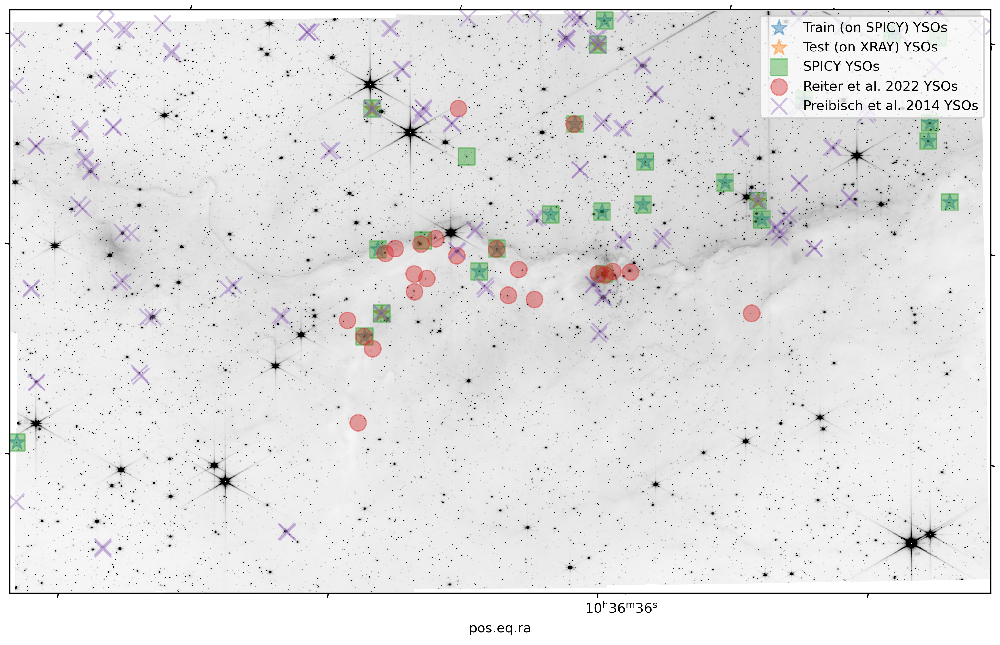

In [514]:
from astropy.io import fits
from astropy.wcs import WCS

# Plot image
filter = "f200w"
image_file = f"../../ngc3324/FITS/JWST_{filter}.fits"
h = fits.getheader(image_file)
f = fits.open(image_file)
wcs = WCS(f[1].header)
fig, ax = plt.subplots(figsize=(14,8),dpi=300)
ax = plt.subplot(projection=wcs)
plt.grid(color='white', ls='solid')
plt.imshow(f[1].data,cmap='gray_r',vmin=0,vmax=20,origin='lower')
ymax, ymin = ax.get_ylim()
xmax, xmin = ax.get_xlim()




reit = ["10:36:42.3 -58:38:04", "10:36:48.0 -58:38:19", "10:36:47.3 -58:38:10", "10:36:46.7 -58:38:05", "10:36:51.5 -58:37:54", "10:36:50.5 -58:37:52",\
    "10:36:51.4 -58:37:48", "10:36:53.8 -58:37:48", "10:36:51.5 -58:37:10", "10:36:54.2 -58:36:26", "10:36:54.4 -58:36:18", "10:36:54.0 -58:37:20",\
        "10:36:53.6 -58:35:20", "10:36:53.1 -58:37:37", "10:36:53.3 -58:37:54", "10:36:52.7 -58:38:05", "10:36:53.1 -58:37:08", "10:36:51.6 -58:36:58",\
        "10:36:52.3 -58:38:09", "10:36:53.9 -58:36:29", "10:37:01.5 -58:37:51", "10:37:02.1 -58:36:58", "10:36:53.9 -58:36:32"]# End of third row is the end of MHO-only sources
r_1 = SkyCoord(reit,unit=(u.hourangle, u.deg))

ra_1 = r_1.ra
dec_1 = r_1.dec

ra_spicy = CC_Webb_Classified.RA.values[CC_Webb_Classified['SPICY_Class_0/1']==0]
dec_spicy = CC_Webb_Classified.DEC.values[CC_Webb_Classified['SPICY_Class_0/1']==0]

ra_x_true = jwst_xray_cat.RA
dec_x_true = jwst_xray_cat.DEC


ra_sp = sp_inp.RA[sp_pre==0]
dec_sp = sp_inp.DEC[sp_pre==0]

ra_x = x_inp.RA[x_pre == 0]
dec_x = x_inp.DEC[x_pre == 0]


plt.scatter(ra_sp,dec_sp, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Train (on SPICY) YSOs')
plt.scatter(ra_x,dec_x, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Test (on XRAY) YSOs') 
plt.scatter(ra_spicy,dec_spicy, marker='s',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='SPICY YSOs')
plt.scatter(ra_1,dec_1, marker='o',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Reiter et al. 2022 YSOs')
plt.scatter(ra_x_true,dec_x_true, marker='x',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Preibisch et al. 2014 YSOs')
ax.set_ylim(ymax, ymin)
ax.set_xlim(xmax, xmin)
plt.legend(loc=1)
ax.grid(False)
# plt.xticks()
# plt.yticks()
# plt.xlabel('RA')
# plt.ylabel('DEC')

## Only XRAY, Test SPICY

In [525]:
inds = np.arange(0,20,2)
prf_cls = prf(n_estimators=100, bootstrap=False, keep_proba=0.25,new_syn_data_frac=0.3, min_py_sum_leaf=0.001)
prf_cls.fit(X=x_inp.values.astype(np.float64)[:,inds], dX=x_inp.values.astype(np.float64)[:,inds+1], py=x_ptar)#y=tar_tr

sp_pre = prf_cls.predict(X=sp_inp.values[:,inds], dX=sp_inp.values[:,inds+1])
x_pre = prf_cls.predict(X=x_inp.values.astype(np.float64)[:,inds], dX=x_inp.values.astype(np.float64)[:,inds+1])
print(classification_report(x_tar,x_pre))
print(classification_report(sp_tar,sp_pre))

print("We find ", len(sp_tar[sp_tar.ravel()==0][sp_pre[sp_tar.ravel()==0] == sp_tar.ravel()[sp_tar.ravel()==0]]), " test sources")

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        76
           1       0.99      1.00      1.00       382

    accuracy                           1.00       458
   macro avg       1.00      0.99      0.99       458
weighted avg       1.00      1.00      1.00       458

              precision    recall  f1-score   support

         0.0       0.13      0.19      0.16        26
         1.0       0.95      0.92      0.93       415

    accuracy                           0.88       441
   macro avg       0.54      0.56      0.55       441
weighted avg       0.90      0.88      0.89       441

We find  5  test sources


/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-06-03T10:07:58.266' from MJD-BEG.
Set DATE-AVG to '2022-06-03T12:45:26.326' from MJD-AVG.
Set DATE-END to '2022-06-03T15:22:38.772' from MJD-END'.
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -82.720248 from OBSGEO-[XYZ].
Set OBSGEO-B to   -31.576394 from OBSGEO-[XYZ].
Set OBSGEO-H to 1654475546.366 from OBSGEO-[XYZ]'.
  warnings.warn(


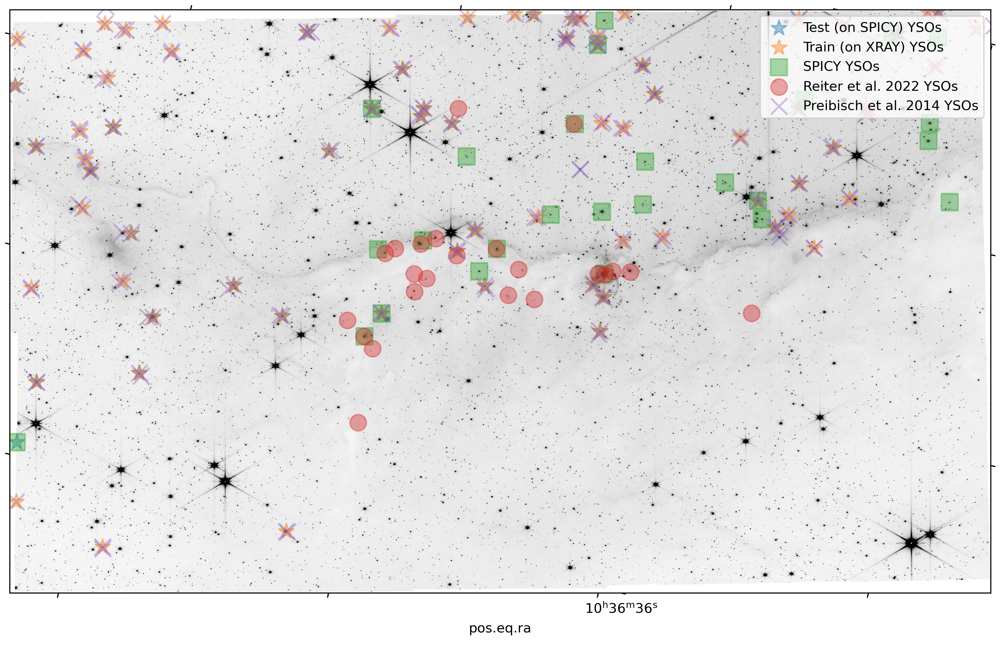

In [526]:
from astropy.io import fits
from astropy.wcs import WCS

# Plot image
filter = "f200w"
image_file = f"../../ngc3324/FITS/JWST_{filter}.fits"
h = fits.getheader(image_file)
f = fits.open(image_file)
wcs = WCS(f[1].header)
fig, ax = plt.subplots(figsize=(14,8),dpi=300)
ax = plt.subplot(projection=wcs)
plt.grid(color='white', ls='solid')
plt.imshow(f[1].data,cmap='gray_r',vmin=0,vmax=20,origin='lower')
ymax, ymin = ax.get_ylim()
xmax, xmin = ax.get_xlim()




reit = ["10:36:42.3 -58:38:04", "10:36:48.0 -58:38:19", "10:36:47.3 -58:38:10", "10:36:46.7 -58:38:05", "10:36:51.5 -58:37:54", "10:36:50.5 -58:37:52",\
    "10:36:51.4 -58:37:48", "10:36:53.8 -58:37:48", "10:36:51.5 -58:37:10", "10:36:54.2 -58:36:26", "10:36:54.4 -58:36:18", "10:36:54.0 -58:37:20",\
        "10:36:53.6 -58:35:20", "10:36:53.1 -58:37:37", "10:36:53.3 -58:37:54", "10:36:52.7 -58:38:05", "10:36:53.1 -58:37:08", "10:36:51.6 -58:36:58",\
        "10:36:52.3 -58:38:09", "10:36:53.9 -58:36:29", "10:37:01.5 -58:37:51", "10:37:02.1 -58:36:58", "10:36:53.9 -58:36:32"]# End of third row is the end of MHO-only sources
r_1 = SkyCoord(reit,unit=(u.hourangle, u.deg))

ra_1 = r_1.ra
dec_1 = r_1.dec

ra_spicy = CC_Webb_Classified.RA.values[CC_Webb_Classified['SPICY_Class_0/1']==0]
dec_spicy = CC_Webb_Classified.DEC.values[CC_Webb_Classified['SPICY_Class_0/1']==0]

ra_x_true = jwst_xray_cat.RA
dec_x_true = jwst_xray_cat.DEC


ra_sp = sp_inp.RA.values[sp_pre==0]
dec_sp = sp_inp.DEC.values[sp_pre==0]

ra_x = x_inp.RA.values[x_pre == 0]
dec_x = x_inp.DEC.values[x_pre == 0]


plt.scatter(ra_sp,dec_sp, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Test (on SPICY) YSOs')
plt.scatter(ra_x,dec_x, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Train (on XRAY) YSOs')
plt.scatter(ra_spicy,dec_spicy, marker='s',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='SPICY YSOs')
plt.scatter(ra_1,dec_1, marker='o',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Reiter et al. 2022 YSOs')
plt.scatter(ra_x_true,dec_x_true, marker='x',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Preibisch et al. 2014 YSOs')
ax.set_ylim(ymax, ymin)
ax.set_xlim(xmax, xmin)
plt.legend(loc=1)
ax.grid(False)
# plt.xticks()
# plt.yticks()
# plt.xlabel('RA')
# plt.ylabel('DEC')

## MIX


In [491]:
from sklearn.model_selection import train_test_split

In [530]:
x_all = x_inp
x_all['Target'] = x_tar
x_all['Prob'] = x_ptar[:,0]
sp_all = sp_inp
sp_all['Target'] = sp_tar
sp_all['Prob'] = sp_ptar[:,0]
mix_all = pd.concat([x_all, sp_all])

mix_tr, mix_te = train_test_split(mix_all.values.astype(np.float64),train_size=0.75)

mix_inp = mix_tr[:,np.arange(0,20,1)]
mix_tar = mix_tr[:,-2]
mix_dtar = mix_tr[:,-1]
mix_ptar = np.array([np.array([x,1-x]) for x in mix_dtar])
mix_radec = mix_tr[:,[20,21]]
mix_inp_te = mix_te[:,np.arange(0,20,1)]
mix_tar_te = mix_te[:,-2]
mix_dtar_te = mix_te[:,-1]
mix_ptar_te = np.array([np.array([x,1-x]) for x in mix_dtar_te])
mix_radec_te = mix_te[:,[20,21]]



inds = np.arange(0,20,2)
prf_cls = prf(n_estimators=100, bootstrap=False, keep_proba=0.25,new_syn_data_frac=0.8, min_py_sum_leaf=0.001)
prf_cls.fit(X=mix_inp[:,inds], dX=mix_inp[:,inds+1], py=mix_ptar)#y=tar_tr

mix_pre = prf_cls.predict(X=mix_inp[:,inds], dX=mix_inp[:,inds+1])
mix_pre_te = prf_cls.predict(X=mix_inp_te[:,inds], dX=mix_inp_te[:,inds+1])
print(classification_report(mix_tar,mix_pre))
print(classification_report(mix_tar_te,mix_pre_te))

print("We find ", len(mix_tar_te[mix_tar_te.ravel()==0][mix_pre_te[mix_tar_te.ravel()==0] == mix_tar_te.ravel()[mix_tar_te.ravel()==0]]), " test sources")

              precision    recall  f1-score   support

         0.0       1.00      0.74      0.85        72
         1.0       0.97      1.00      0.98       602

    accuracy                           0.97       674
   macro avg       0.98      0.87      0.92       674
weighted avg       0.97      0.97      0.97       674

              precision    recall  f1-score   support

         0.0       0.42      0.27      0.33        30
         1.0       0.89      0.94      0.92       195

    accuracy                           0.85       225
   macro avg       0.66      0.61      0.62       225
weighted avg       0.83      0.85      0.84       225

We find  8  test sources


/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-06-03T10:07:58.266' from MJD-BEG.
Set DATE-AVG to '2022-06-03T12:45:26.326' from MJD-AVG.
Set DATE-END to '2022-06-03T15:22:38.772' from MJD-END'.
  warnings.warn(
/Users/breannacrompvoets/miniforge3/envs/SF/lib/python3.10/site-packages/astropy/wcs/wcs.py:725: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -82.720248 from OBSGEO-[XYZ].
Set OBSGEO-B to   -31.576394 from OBSGEO-[XYZ].
Set OBSGEO-H to 1654475546.366 from OBSGEO-[XYZ]'.
  warnings.warn(


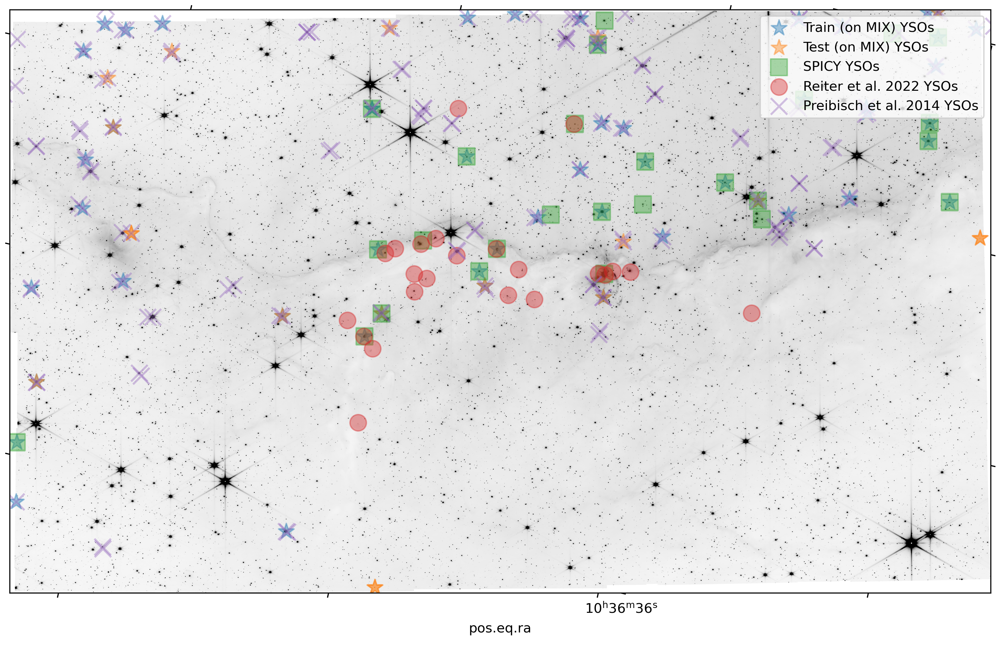

In [531]:
from astropy.io import fits
from astropy.wcs import WCS

# Plot image
filter = "f200w"
image_file = f"../../ngc3324/FITS/JWST_{filter}.fits"
h = fits.getheader(image_file)
f = fits.open(image_file)
wcs = WCS(f[1].header)
fig, ax = plt.subplots(figsize=(14,8),dpi=300)
ax = plt.subplot(projection=wcs)
plt.grid(color='white', ls='solid')
plt.imshow(f[1].data,cmap='gray_r',vmin=0,vmax=20,origin='lower')
ymax, ymin = ax.get_ylim()
xmax, xmin = ax.get_xlim()




reit = ["10:36:42.3 -58:38:04", "10:36:48.0 -58:38:19", "10:36:47.3 -58:38:10", "10:36:46.7 -58:38:05", "10:36:51.5 -58:37:54", "10:36:50.5 -58:37:52",\
    "10:36:51.4 -58:37:48", "10:36:53.8 -58:37:48", "10:36:51.5 -58:37:10", "10:36:54.2 -58:36:26", "10:36:54.4 -58:36:18", "10:36:54.0 -58:37:20",\
        "10:36:53.6 -58:35:20", "10:36:53.1 -58:37:37", "10:36:53.3 -58:37:54", "10:36:52.7 -58:38:05", "10:36:53.1 -58:37:08", "10:36:51.6 -58:36:58",\
        "10:36:52.3 -58:38:09", "10:36:53.9 -58:36:29", "10:37:01.5 -58:37:51", "10:37:02.1 -58:36:58", "10:36:53.9 -58:36:32"]# End of third row is the end of MHO-only sources
r_1 = SkyCoord(reit,unit=(u.hourangle, u.deg))

ra_1 = r_1.ra
dec_1 = r_1.dec

ra_spicy = CC_Webb_Classified.RA.values[CC_Webb_Classified['SPICY_Class_0/1']==0]
dec_spicy = CC_Webb_Classified.DEC.values[CC_Webb_Classified['SPICY_Class_0/1']==0]

ra_x_true = jwst_xray_cat.RA
dec_x_true = jwst_xray_cat.DEC


ra_mix = mix_radec[mix_pre==0,0]
dec_mix = mix_radec[mix_pre==0,1]
ra_mix_te = mix_radec_te[mix_pre_te==0,0]
dec_mix_te = mix_radec_te[mix_pre_te==0,1]



plt.scatter(ra_mix,dec_mix, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Train (on MIX) YSOs')
plt.scatter(ra_mix_te,dec_mix_te, marker='*', s=150,alpha=0.4,transform=ax.get_transform('fk5'),label='Test (on MIX) YSOs')
plt.scatter(ra_spicy,dec_spicy, marker='s',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='SPICY YSOs')
plt.scatter(ra_1,dec_1, marker='o',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Reiter et al. 2022 YSOs')
plt.scatter(ra_x_true,dec_x_true, marker='x',s=150, alpha=0.4,transform=ax.get_transform('fk5'),label='Preibisch et al. 2014 YSOs')
ax.set_ylim(ymax, ymin)
ax.set_xlim(xmax, xmin)
plt.legend(loc=1)
ax.grid(False)
# plt.xticks()
# plt.yticks()
# plt.xlabel('RA')
# plt.ylabel('DEC')

In [383]:
print(len(cat[cat.In_Spitzer==True][['XRAY','In_Spitzer']]))
print(len(cat[cat.XRAY==True][['XRAY','In_Spitzer']]))
cat[cat.Class==0][cat.XRAY==True][['XRAY','In_Spitzer', 'SPICY','Class']]


32
76


/var/folders/qy/7yz8bmv96hx8rndql_rfdz_80000gn/T/ipykernel_89688/1372626447.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cat[cat.Class==0][cat.XRAY==True][['XRAY','In_Spitzer', 'SPICY','Class']]


,XRAY,In_Spitzer,SPICY,Class
49,True,True,7428.0,0.0
2251,True,False,7461.0,0.0
3015,True,True,7477.0,0.0
8574,True,False,NaN,0.0
